# Imports

In [ ]:
# !pip install torch
# !pip install nibabel
# !pip PIL
# !pip install numpy
# !pip install torchio

In [ ]:
#have to upgrade due to a version issue with TPU runtime
!pip install --upgrade nibabel
!pip install nibabel[arrayproxy]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 16.5 MB/s eta 0:00:00
  Attempting uninstall: nibabel
    Found existing installation: nibabel 4.0.2
    Uninstalling nibabel-4.0.2:
      Successfully uninstalled nibabel-4.0.2


In [ ]:
import nibabel as nb
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import sys
from tqdm import tqdm
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from sklearn.model_selection import train_test_split
import math
import pickle

# Load the stored npy data from drive

## Access the data

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd "/content/drive/MyDrive/Publications and Researches/Multi-Disease, Multi-View & Multi-Center Right Ventricular Segmentation in Cardiac MRI/updated data"

/content/drive/MyDrive/Publications and Researches/Multi-Disease, Multi-View & Multi-Center Right Ventricular Segmentation in Cardiac MRI/updated data


## training

In [ ]:
images = np.load('MnM2/training/SA/images.npy')
masks = np.load('MnM2/training/SA/masks.npy')

## testing

In [ ]:
images_testing = np.load('MnM2/testing/SA/images.npy')
masks_testing = np.load('MnM2/testing/SA/masks.npy')

## validation

In [ ]:
images_validation = np.load('MnM2/validation/SA/images.npy')
masks_validation = np.load('MnM2/validation/SA/masks.npy')

# Transforms

In [ ]:
def replace_tensor_value_(tensor):
    return tensor

input_transform = transforms.Compose(
    [
        transforms.ToTensor()
    ]
)

targets_transform = transforms.Compose(
    [
        transforms.ToTensor()
    ]
)

# Hyperparams

In [ ]:
learning_rate = 0.0001
batch_size = 2
num_epochs = 200

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('The current processor is ...', device)

The current processor is ... cuda


In [ ]:
torch.cuda.empty_cache()

# Data Loaders

In [ ]:
class MyDataset(Dataset):
  def __init__(self, data, targets, transform=None, target_transform=None):
    self.data = data
    self.targets = targets

    self.transform = transform
    self.target_transform = target_transform

  def __getitem__(self, index):
    x = self.data[index]
    y = self.targets[index]

    if self.transform:
      x = self.data[index]
      x = self.transform(x)

    if self.target_transform:
      y = self.targets[index]
      y = self.target_transform(y)

    return x, y

  def __len__(self):
    return len(self.data)

train_dataset = MyDataset(images, masks, transform=input_transform, target_transform=targets_transform)

# del images
# del masks

test_dataset = MyDataset(images_testing, masks_testing, transform=input_transform, target_transform=targets_transform)

# del images_testing
# del masks_testing

val_dataset = MyDataset(images_validation, masks_validation, transform=input_transform, target_transform=targets_transform)

# del images_validation
# del masks_validation

train_loader = DataLoader(train_dataset, batch_size=batch_size)
del train_dataset

test_loader = DataLoader(test_dataset, batch_size=batch_size)
del test_dataset

val_loader = DataLoader(val_dataset, batch_size=batch_size)
del val_dataset

In [ ]:
inputs, classes = next(iter(train_loader))
inputs.shape, inputs.min(), inputs.max(), classes.shape, classes.min(), classes.max()

(torch.Size([2, 32, 240, 240]),
 tensor(0., dtype=torch.float64),
 tensor(3891.8333, dtype=torch.float64),
 torch.Size([2, 32, 240, 240]),
 tensor(0., dtype=torch.float64),
 tensor(3., dtype=torch.float64))

# Loss functions

## Dice Score and Loss

In [ ]:
import torch
from torch import Tensor

def dice_coeff(input: Tensor, target: Tensor, reduce_batch_first: bool = False, epsilon=1e-6):
    # Average of Dice coefficient for all batches, or for a single mask
    assert input.size() == target.size()
    if input.dim() == 2 and reduce_batch_first:
        raise ValueError(f'Dice: asked to reduce batch but got tensor without batch dimension (shape {input.shape})')

    if input.dim() == 2 or reduce_batch_first:
        inter = torch.dot(input.reshape(-1), target.reshape(-1))
        sets_sum = torch.sum(input) + torch.sum(target)
        if sets_sum.item() == 0:
            sets_sum = 2 * inter

        return (2 * inter + epsilon) / (sets_sum + epsilon)
    else:
        # compute and average metric for each batch element
        dice = 0
        for i in range(input.shape[0]):
            dice += dice_coeff(input[i, ...], target[i, ...])
        return dice / input.shape[0]


def multiclass_dice_coeff(input: Tensor, target: Tensor, reduce_batch_first: bool = False, epsilon=1e-6):
    # Average of Dice coefficient for all classes
    assert input.size() == target.size()
    dice = 0
    for channel in range(input.shape[1]):
        dice += dice_coeff(input[:, channel, ...], target[:, channel, ...], reduce_batch_first, epsilon)

    return dice / input.shape[1]


def dice_loss(input: Tensor, target: Tensor, multiclass: bool = False):
    # Dice loss (objective to minimize) between 0 and 1
    # print("input size", input.size())
    # print("target size", target.size())
    assert input.size() == target.size()
    fn = multiclass_dice_coeff if multiclass else dice_coeff
    return 1 - fn(input, target, reduce_batch_first=True)


## Hausdorff distance

In [ ]:
def hausdorff_distance(tensor1, tensor2):
    # Reshape tensors to [batch_size, x] where x is flattened
    tensor1_flat = tensor1.reshape(2, -1)
    tensor2_flat = tensor2.reshape(2, -1)

    # Calculate pairwise Euclidean distance between all points
    distances = torch.cdist(tensor1_flat, tensor2_flat)

    # Find shortest distance from tensor1 to tensor2
    shortest_distance_1to2, _ = torch.min(distances, dim=1)

    # Find shortest distance from tensor2 to tensor1
    shortest_distance_2to1, _ = torch.min(distances, dim=0)

    # Hausdorff Distance is the maximum of the shortest distances
    hausdorff_distance = torch.max(shortest_distance_1to2.max(), shortest_distance_2to1.max())

    return hausdorff_distance

# def hd_loss(mask_pred, mask_true):
#     hd_distance = 0.0
#     hd_per_img = 0.0
#     for x,y in zip(mask_pred,mask_true):
#       # HD for a single voxel
#       dist = hausdorff_distance(x.cpu(), y.cpu())
#       hd_per_img += dist
#     # compute the averaged_hausdorff_distance, ignoring background
#     hd_distance += hd_per_img / batch_size
#     return hd_distance

def hd_loss(mask_pred, mask_true):
    num_classes = mask_pred.size(1)  # Number of classes
    batch_size = mask_pred.size(0)   # Batch size

    hd_loss_per_class = []

    for class_idx in range(num_classes):
        hd_per_class = 0.0
        for batch_idx in range(batch_size):
            # Calculate HD for a single class in a single image
            dist = hausdorff_distance(mask_pred[batch_idx, class_idx].cpu(), mask_true[batch_idx, class_idx].cpu())
            hd_per_class += dist

        # Average HD for this class across the batch
        hd_loss_per_class.append(hd_per_class / batch_size)

    # Compute the average HD loss across all classes
    loss = torch.mean(torch.stack(hd_loss_per_class))

    return loss

# UNet Model

In [ ]:
import torch.nn as nn

class UNet3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet3D, self).__init__()
        #model props
        self.in_channels = in_channels
        self.out_channels = out_channels

        # Encoder blocks
        self.encoder1 = self.double_conv(in_channels, 32)
        self.pool1 = nn.MaxPool3d(2)
        self.encoder2 = self.double_conv(32, 64)
        self.pool2 = nn.MaxPool3d(2)
        self.encoder3 = self.double_conv(64, 128)
        self.pool3 = nn.MaxPool3d(2)
        self.encoder4 = self.double_conv(128, 256)
        self.pool4 = nn.MaxPool3d(2)

        # Middle block
        self.middle = self.double_conv(256, 512)

        # Decoder blocks
        self.up1 = nn.ConvTranspose3d(512, 256, kernel_size=2, stride=2)
        self.decoder1 = self.double_conv(512, 256)
        self.up2 = nn.ConvTranspose3d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = self.double_conv(256, 128)
        self.up3 = nn.ConvTranspose3d(128, 64, kernel_size=2, stride=2)
        self.decoder3 = self.double_conv(128, 64)
        self.up4 = nn.ConvTranspose3d(64, 32, kernel_size=2, stride=2)
        self.decoder4 = self.double_conv(64, 32)

        # Output block
        self.out_conv = nn.Conv3d(32, out_channels, kernel_size=1)

    def forward(self, x):

        # Encoder
        enc1 = self.encoder1(x)
        enc1_pool = self.pool1(enc1)

        enc2 = self.encoder2(enc1_pool)
        enc2_pool = self.pool2(enc2)

        enc3 = self.encoder3(enc2_pool)
        enc3_pool = self.pool3(enc3)

        enc4 = self.encoder4(enc3_pool)
        enc4_pool = self.pool4(enc4)

        # Middle
        middle = self.middle(enc4_pool)

        # Decoder
        dec1 = self.up1(middle)
        dec1 = torch.cat([enc4, dec1], dim=1)
        dec1 = self.decoder1(dec1)

        dec2 = self.up2(dec1)
        dec2 = torch.cat([enc3, dec2], dim=1)
        dec2 = self.decoder2(dec2)

        dec3 = self.up3(dec2)
        dec3 = torch.cat([enc2, dec3], dim=1)
        dec3 = self.decoder3(dec3)

        dec4 = self.up4(dec3)
        dec4 = torch.cat([enc1, dec4], dim=1)
        dec4 = self.decoder4(dec4)

        # Output
        output = self.out_conv(dec4)
        return output

    def double_conv(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )

# Training

In [ ]:
# Create the 3D UNet model
in_channels = 1
out_channels = 4
model = UNet3D(in_channels, out_channels).to(device)

In [ ]:
import torch
from torchsummary import summary

# Display the model summary
summary(model, input_size=(1, 240, 240, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv3d-1     [-1, 32, 240, 240, 32]             896
       BatchNorm3d-2     [-1, 32, 240, 240, 32]              64
              ReLU-3     [-1, 32, 240, 240, 32]               0
            Conv3d-4     [-1, 32, 240, 240, 32]          27,680
       BatchNorm3d-5     [-1, 32, 240, 240, 32]              64
              ReLU-6     [-1, 32, 240, 240, 32]               0
         MaxPool3d-7     [-1, 32, 120, 120, 16]               0
            Conv3d-8     [-1, 64, 120, 120, 16]          55,360
       BatchNorm3d-9     [-1, 64, 120, 120, 16]             128
             ReLU-10     [-1, 64, 120, 120, 16]               0
           Conv3d-11     [-1, 64, 120, 120, 16]         110,656
      BatchNorm3d-12     [-1, 64, 120, 120, 16]             128
             ReLU-13     [-1, 64, 120, 120, 16]               0
        MaxPool3d-14        [-1, 64, 60

In [ ]:
import torch.optim as optim
# from torch.optim.lr_scheduler import StepLR

# optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# scheduler = StepLR(optimizer, 50, 0.1)
criterion = nn.CrossEntropyLoss()


from torch.optim.lr_scheduler import CosineAnnealingLR

optimizer = optim.RMSprop(model.parameters(), lr=learning_rate, weight_decay=1e-8, momentum=0.9)
scheduler = CosineAnnealingLR(optimizer, T_max=10)
grad_scaler = torch.cuda.amp.GradScaler(enabled=False)
criterion = nn.CrossEntropyLoss()
global_step = 0

## Test the model with one batch

In [ ]:
inputs, classes = next(iter(val_loader)) # without normalization
inputs.shape, inputs.min(), inputs.max(), classes.shape, classes.min(), classes.max()

(torch.Size([2, 32, 240, 240]),
 tensor(0., dtype=torch.float64),
 tensor(600.5000, dtype=torch.float64),
 torch.Size([2, 32, 240, 240]),
 tensor(0., dtype=torch.float64),
 tensor(3., dtype=torch.float64))

In [ ]:
in_batch = inputs.unsqueeze(1).to(dtype=torch.float).to(device)
in_batch.shape

torch.Size([2, 1, 32, 240, 240])

In [ ]:
#forward p
optimizer.zero_grad()
pred_mask = model(in_batch)

In [ ]:
print('shape of pred_mask: ', pred_mask.shape)
# Softmax - predictions
predicted_masks_ohe = F.softmax(pred_mask, dim=1).float()
classes_1 = classes.to(dtype=torch.long).to(device)
masks_one_hot = F.one_hot(classes_1, model.out_channels).float().permute(0, 4, 1, 2, 3)
print('shape of masks_one_hot: ',masks_one_hot.shape)
loss = criterion(pred_mask, masks_one_hot)
print("loss: ", loss.item())

shape of pred_mask:  torch.Size([1, 4, 32, 240, 240])
shape of masks_one_hot:  torch.Size([1, 4, 32, 240, 240])
loss:  1.2232102155685425


In [ ]:
#backward p
optimizer.zero_grad(set_to_none=True)
loss.backward()
optimizer.step()

## Training Loop

In [ ]:
training_data = {"loss":[], "epoch":[],"lr":[], "dice_loss":[], "hd_loss":[], "multiclass_dice_score": [] }
model_path = '../final_model/vanila_unet_512/batch-size-2-RMSprop-CosineAnnealingLR-prelu-200-epoch-dice-hd-induvidual-class-loss_base_without_prelu'
num_epochs = 200
model.train()

UNet3D(
  (encoder1): Sequential(
    (0): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (4): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (pool1): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): Sequential(
    (0): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (4): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (pool2): MaxPool3d(kernel_size=2, stride=

In [ ]:
min_loss = math.inf

# epoch loop
for epoch in range(num_epochs):

  total_loss = 0
  dice_loss_val = 0
  hd_loss_val = 0
  dice_score_val = 0
  # Dataloader
  for ix, (image, mask) in enumerate(train_loader):

    # zero the parameter gradients
    optimizer.zero_grad()

    # data compartmentalization
    image = image.unsqueeze(1).to(dtype=torch.float).to(device)
    mask = mask.to(dtype=torch.long).to(device)

    # forward prop
    predicted_masks = model(image)

    # One Hot Encode - mask
    masks_ohe = F.one_hot(mask, model.out_channels).float()
    masks_ohe = masks_ohe.permute(0, 4, 1, 2, 3)

    # Softmax - predictions
    predicted_masks_ohe = F.softmax(predicted_masks, dim=1).float()

    # loss
    mean_dice_loss = dice_loss(predicted_masks_ohe,  masks_ohe, multiclass=True)
    mean_hd_loss = hd_loss(predicted_masks_ohe,  masks_ohe)


    lambda_param = (mean_hd_loss/mean_dice_loss) if epoch == 0 else (epoch_hd_loss_val/epoch_dice_loss_val)
    loss = lambda_param * mean_dice_loss + mean_hd_loss

    with torch.no_grad():
      dice_score = multiclass_dice_coeff(predicted_masks_ohe,  masks_ohe, reduce_batch_first=False)
      total_loss += loss.item()
      dice_loss_val += mean_dice_loss.item()
      hd_loss_val += mean_hd_loss.item()
      dice_score_val += dice_score.item()

    # back prop + optim
    # optimizer.zero_grad(set_to_none=True)
    # loss.backward()
    # optimizer.step()

    grad_scaler.scale(loss).backward()
    grad_scaler.step(optimizer)
    grad_scaler.update()

  epoch_loss = total_loss / len(train_loader)
  epoch_dice_loss_val = dice_loss_val / len(train_loader)
  epoch_hd_loss_val = hd_loss_val / len(train_loader)
  epoch_dice_score = dice_score_val / len(train_loader)
  length = len(training_data['loss'])

  scheduler.step()

  training_data["loss"].append(epoch_loss) # append average accuracy for this epoch
  training_data["epoch"].append(epoch)
  training_data["lr"].append(optimizer.param_groups[0]['lr'])
  training_data["dice_loss"].append(epoch_dice_loss_val)
  training_data["hd_loss"].append(epoch_hd_loss_val)
  training_data["multiclass_dice_score"].append(epoch_dice_score)

  print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.4f}, Dice Loss: {epoch_dice_loss_val:.4f}, Epoch Dice Score: {epoch_dice_score:.4f}, HD Loss: {epoch_hd_loss_val:.4f}, lr: {optimizer.param_groups[0]["lr"]:.4f}')
  if epoch_loss < min_loss:
    torch.save(model.state_dict(), f'{model_path}.pt')
    with open(f'{model_path}.pkl', 'wb') as f:
        pickle.dump(training_data, f)

    min_loss = epoch_loss

Epoch 1/200, Loss: 285.9984, Dice Loss: 0.7682, Epoch Dice Score: 0.2254, HD Loss: 142.9992, lr: 0.0001
Epoch 2/200, Loss: 205.9726, Dice Loss: 0.6751, Epoch Dice Score: 0.2751, HD Loss: 80.3126, lr: 0.0001
Epoch 3/200, Loss: 140.4623, Dice Loss: 0.5476, Epoch Dice Score: 0.3041, HD Loss: 75.3186, lr: 0.0001
Epoch 4/200, Loss: 133.2665, Dice Loss: 0.4461, Epoch Dice Score: 0.3226, HD Loss: 71.8989, lr: 0.0001
Epoch 5/200, Loss: 131.5486, Dice Loss: 0.3865, Epoch Dice Score: 0.3352, HD Loss: 69.2577, lr: 0.0000
Epoch 6/200, Loss: 127.8908, Dice Loss: 0.3408, Epoch Dice Score: 0.3454, HD Loss: 66.8189, lr: 0.0000
Epoch 7/200, Loss: 122.4829, Dice Loss: 0.3018, Epoch Dice Score: 0.3542, HD Loss: 63.3105, lr: 0.0000
Epoch 8/200, Loss: 119.2482, Dice Loss: 0.2770, Epoch Dice Score: 0.3607, HD Loss: 61.1418, lr: 0.0000
Epoch 9/200, Loss: 118.5392, Dice Loss: 0.2635, Epoch Dice Score: 0.3650, HD Loss: 60.3825, lr: 0.0000
Epoch 10/200, Loss: 118.2079, Dice Loss: 0.2547, Epoch Dice Score: 0.368

# Save and Load model

In [ ]:
#persist full training data
with open(f'{model_path}.pkl', 'wb') as f:
        pickle.dump(training_data, f)
len(training_data['epoch'])

NameError: name 'model_path' is not defined

In [ ]:
import pickle

# model_path = '../final_model/vanila_unet_512/sa-batch-size-2-RMSprop-CosineAnnealingLR-prelu-200-with-resblocks'
model_path = '../final_model/vanila_unet_512/batch-size-2-RMSprop-CosineAnnealingLR-prelu-200-epoch-dice-hd-induvidual-class-loss_base_without_prelu'
# Later, you can load the model from the file
model = UNet3D(1,4).to(device)
model.load_state_dict(torch.load(f'{model_path}.pt'))
with open(f'{model_path}.pkl', 'rb') as filehandle:
    loaded_training_data  = pickle.load(filehandle)

In [ ]:
for i in range(len(loaded_training_data['epoch'])):
  print(f"({loaded_training_data['epoch'][i]}, {loaded_training_data['hd_loss'][i]})")

(0, 142.9991810321808)
(1, 80.31263418197632)
(2, 75.31855745315552)
(3, 71.89893321990967)
(4, 69.25769019126892)
(5, 66.81894149780274)
(6, 63.310468435287476)
(7, 61.141832530498505)
(8, 60.382470273971556)
(9, 59.84996674060822)
(10, 59.729114580154416)
(11, 58.702366495132445)
(12, 58.018071186542514)
(13, 58.00152721405029)
(14, 57.59919450283051)
(15, 57.90749108791351)
(16, 57.60327121019363)
(17, 57.95763059854507)
(18, 56.80459294319153)
(19, 55.86728370189667)
(20, 55.23945496082306)
(21, 55.37019407749176)
(22, 53.50129419565201)
(23, 52.18045295476914)
(24, 52.170948243141176)
(25, 51.310355842113495)
(26, 50.5618430018425)
(27, 49.428736770153044)
(28, 48.639900064468385)
(29, 49.125705254077914)
(30, 49.03223115205765)
(31, 48.21608374118805)
(32, 47.4268652677536)
(33, 47.438925731182096)
(34, 46.99734809398651)
(35, 47.216320836544035)
(36, 47.687968313694)
(37, 47.636548805236814)
(38, 48.2063604593277)
(39, 47.721923649311066)
(40, 46.852875483036044)
(41, 46.0149662

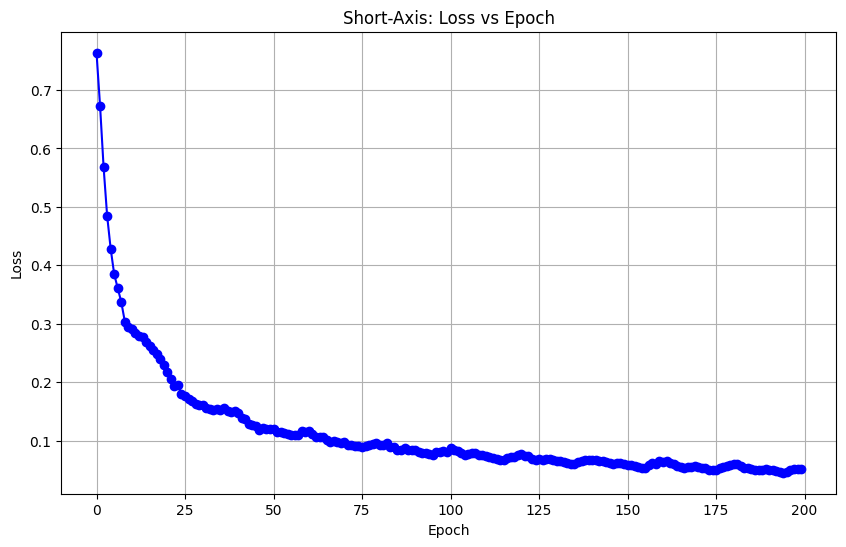

In [ ]:
import matplotlib.pyplot as plt

epoch = loaded_training_data['epoch']
loss = loaded_training_data['loss']
dice_loss = loaded_training_data['dice_loss']
hd_loss = loaded_training_data['hd_loss']

# plot epoch vs loss
plt.figure(figsize=(10, 6))
plt.plot(epoch, dice_loss, marker='o', linestyle='-', color='b')
plt.title('Short-Axis: Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()


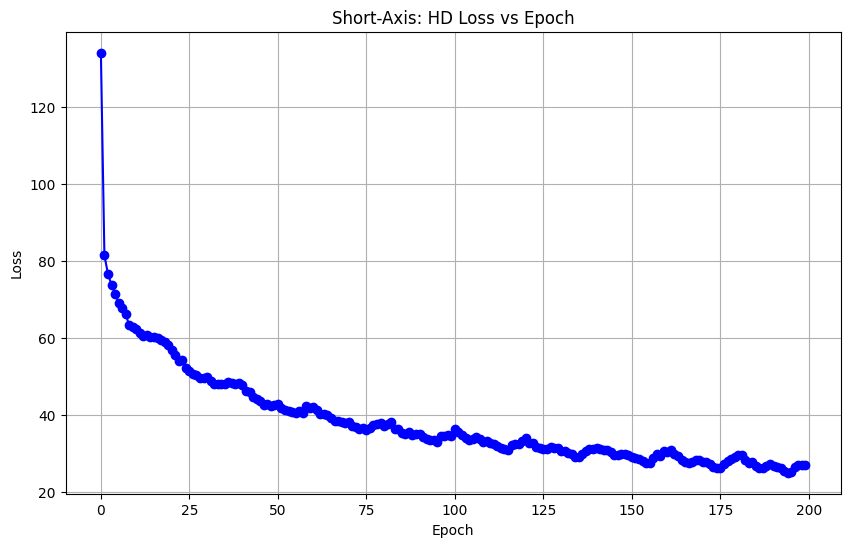

In [ ]:
# plot epoch vs hd loss
plt.figure(figsize=(10, 6))
plt.plot(epoch, hd_loss, marker='o', linestyle='-', color='b')
plt.title('Short-Axis: HD Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()


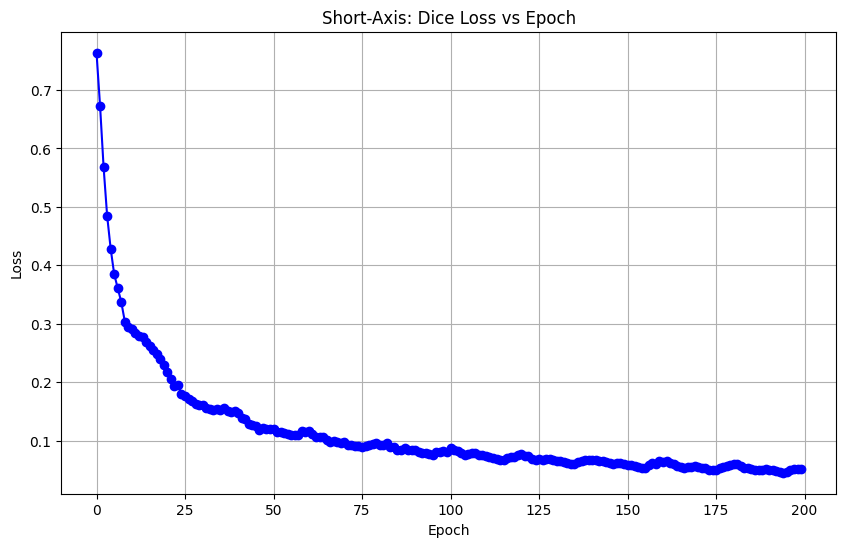

In [ ]:
# plot epoch vs dice loss
plt.figure(figsize=(10, 6))
plt.plot(epoch, dice_loss, marker='o', linestyle='-', color='b')
plt.title('Short-Axis: Dice Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

# Evaluate

In [ ]:
# Eval mode
model.eval()

UNet3D(
  (encoder1): Sequential(
    (0): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (4): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (pool1): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): Sequential(
    (0): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (4): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (pool2): MaxPool3d(kernel_size=2, stride=

## Dice Score

In [ ]:
import torch
import torch.nn.functional as F
from tqdm import tqdm

def evaluate(net, dataloader, device):
    num_val_batches = len(dataloader)
    dice_scores = [0] * net.out_channels  # Initialize a list to store Dice scores for each class

    # iterate over the validation set
    for ix, (images, true_masks) in enumerate(dataloader):
        # data compartmentalization
        image = images.unsqueeze(1).float().to(device)
        mask_true = true_masks.to(dtype=torch.long).to(device)

        # One Hot Encode
        mask_true = F.one_hot(mask_true, net.out_channels).float().permute(0, 4, 1, 2, 3)

        with torch.no_grad():
            # predict the mask
            mask_pred = net(image)

            # Convert predictions to labels
            mask_pred = F.one_hot(mask_pred.argmax(dim=1), net.out_channels).float().permute(0, 4, 1, 2, 3)

            # compute the Dice score for each class (channel)
            for channel in range(net.out_channels):
                dice_scores[channel] += dice_coeff(mask_pred[:, channel, ...], mask_true[:, channel, ...], reduce_batch_first=False)

    # Calculate the average Dice score for each class
    scores = [f"class {i} : {dice_score.item() / num_val_batches}" for i, dice_score in enumerate(dice_scores)]
    avg_dice_score = torch.mean(torch.stack(dice_scores)) / num_val_batches
    scores.append(f"average: {avg_dice_score}")

    return scores

In [ ]:
evaluate(model, train_loader, device) # Train Dice Score

['class 0 : 0.9991722106933594',
 'class 1 : 0.9535328865051269',
 'class 2 : 0.9185846328735352',
 'class 3 : 0.9382423400878906',
 'average: 0.9523830413818359']

In [ ]:
evaluate(model, val_loader, device) # Validation Dice Score

['class 0 : 0.9988042831420898',
 'class 1 : 0.9408880233764648',
 'class 2 : 0.8952865600585938',
 'class 3 : 0.9187695503234863',
 'average: 0.9384371042251587']

In [ ]:
evaluate(model, test_loader, device) # Test Dice Score

['class 0 : 0.9974547386169433',
 'class 1 : 0.9072420120239257',
 'class 2 : 0.8560957908630371',
 'class 3 : 0.8836179733276367',
 'average: 0.9111025929450989']

## Hausdorf

In [ ]:
import torch
import torch.nn.functional as F

def evaluation_hd(net, dataloader, device):
    num_val_batches = len(dataloader)
    num_classes = net.out_channels  # Number of classes
    hd_loss_per_class = [0.0] * num_classes  # Initialize HD loss for each class

    # iterate over the validation set
    for ix, (images, true_masks) in enumerate(dataloader):

        # data compartmentalization
        image = images.unsqueeze(1).float().to(device)
        mask_true = true_masks.to(dtype=torch.long).to(device)

        # One Hot Encode
        mask_true = F.one_hot(mask_true, net.out_channels).float().permute(0, 4, 1, 2, 3)

        with torch.no_grad():
            # predict the mask
            mask_pred = net(image)

            # Convert predictions to labels
            mask_pred = F.one_hot(mask_pred.argmax(dim=1), num_classes).float().permute(0, 4, 1, 2, 3)
            batch_size = mask_pred.size(0)

            for class_idx in range(num_classes):
                hd_per_class = 0.0
                for batch_idx in range(batch_size):
                    # Calculate HD for a single class in a single image
                    dist = hausdorff_distance(mask_pred[batch_idx, class_idx], mask_true[batch_idx, class_idx])
                    hd_per_class += dist

                # Accumulate HD loss for this class
                hd_loss_per_class[class_idx] += hd_per_class/batch_size

    scores = [f"class {i} : {hd_score / num_val_batches}" for i, hd_score in enumerate(hd_loss_per_class)]
    avg_hd_score = torch.mean(torch.stack(hd_loss_per_class)) / num_val_batches
    scores.append(f"average: {avg_hd_score}")

    return scores



In [ ]:
evaluation_hd(model, train_loader, device) # Training Hausdorff Dist

['class 0 : 50.88114547729492',
 'class 1 : 30.635313034057617',
 'class 2 : 44.932945251464844',
 'class 3 : 36.30088806152344',
 'average: 40.68757247924805']

In [ ]:
evaluation_hd(model, val_loader, device) # Validation Hausdorff Dist

['class 0 : 62.16650390625',
 'class 1 : 36.31461715698242',
 'class 2 : 50.27035140991211',
 'class 3 : 44.79987335205078',
 'average: 48.38783645629883']

In [ ]:
evaluation_hd(model, test_loader, device) # Test Hausdorff Dist

['class 0 : 85.55284881591797',
 'class 1 : 49.1525993347168',
 'class 2 : 64.68318939208984',
 'class 3 : 59.05172348022461',
 'average: 64.61009216308594']

# Display Predicted Image

In [ ]:
def plot_pred_images(image, gt_image, pred_image, ix):
    fig = plt.figure(figsize=(15, 15))
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Index: '+str(ix))
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(gt_image)
    plt.title('Ground Truth')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    # plt.imshow(np.fliplr(np.rot90(pred_image, k=-1)))
    plt.imshow(pred_image)
    plt.title('Prediction')
    plt.axis('off')
    plt.show()


In [ ]:
def predict_img(net, full_img, groud_truth, device):
    net.eval()

    with torch.no_grad():

        output = net(full_img.unsqueeze(1).to(device))

        final_mask_batch = []

        print(output.shape)

        output = output.permute(0,2,1,3,4)
        print(output.shape)

        for img3d in output:
          im2 = []
          for img2d in img3d:
            final_mask = np.argmax(img2d.cpu().detach().numpy(), axis=0)
            plt.imshow(final_mask)
            plt.show()
            # im2.append(final_mask)
          # final_mask_batch.append(im2)

    #     final_mask_batch = np.array(final_mask_batch)

    # for ix, (a,b,c) in enumerate(zip(full_img, groud_truth, final_mask_batch)):
    #   print("============================= 3D image no: " + str(ix+1) )
    #   for ix, (img, lbl, pred) in enumerate(zip(a,b,c)):
    #     # Filter out the black-empty images
    #     if not torch.all(img == 0):
    #       plot_pred_images(img, lbl, pred, ix)

In [ ]:
torch.tensor(images_validation[56]).float().permute(2,0,1).shape


torch.Size([32, 240, 240])

In [ ]:
inputs.shape

torch.Size([2, 32, 240, 240])

torch.Size([32, 240, 240])
torch.Size([1, 32, 4, 240, 240])


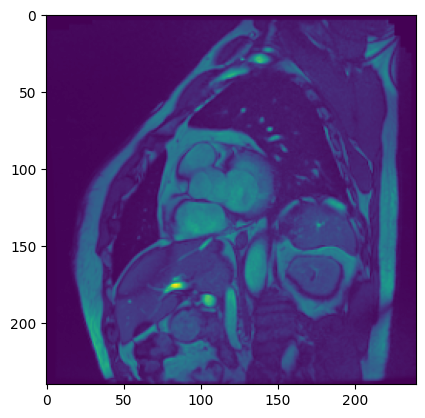

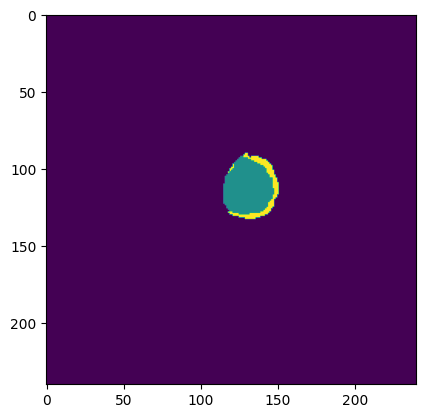

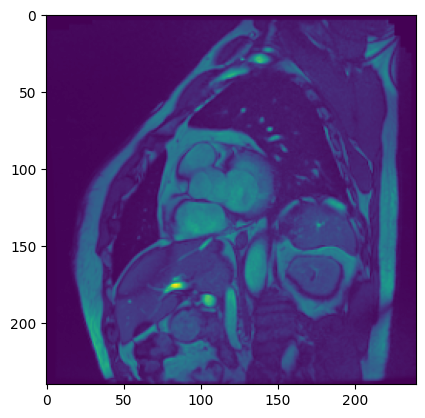

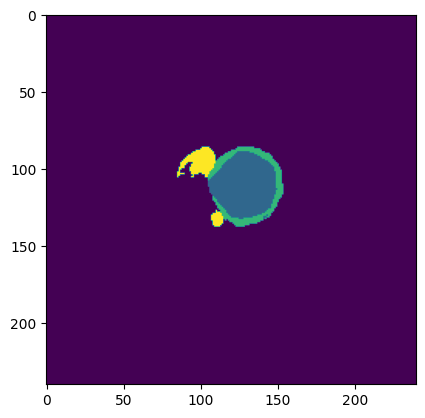

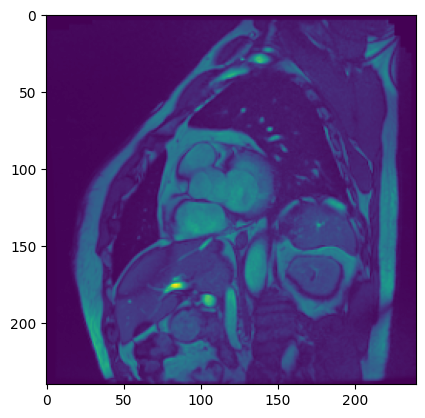

...

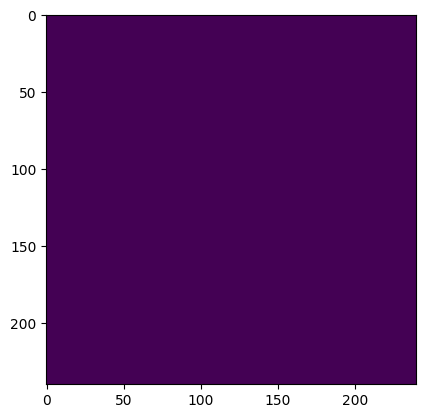

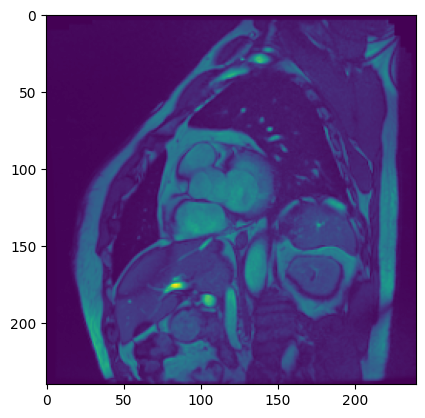

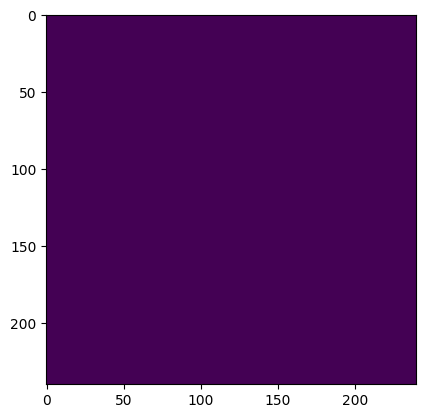

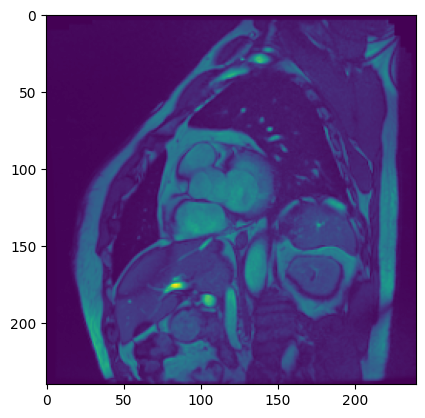

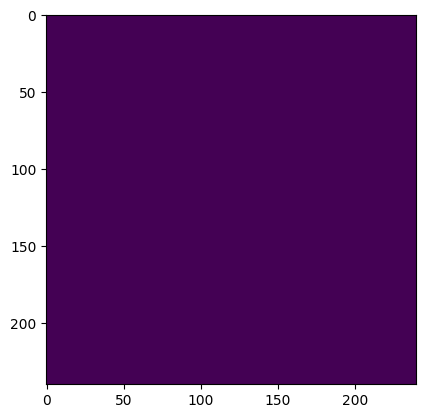

In [ ]:
def visualize_prediction(net, full_img, device):
    net.eval()

    with torch.no_grad():

        output = net(full_img.unsqueeze(0).unsqueeze(1).to(device))

        final_mask_batch = []

        print(full_img.shape)

        output = output.permute(0,2,1,3,4)
        print(output.shape)

        for ix, img3d in enumerate(output):
          im2 = []
          for img2d in img3d:
            final_mask = np.argmax(img2d.cpu().detach().numpy(), axis=0)
            plt.imshow(full_img[ix])
            plt.show()
            plt.imshow(final_mask)
            plt.show()
# Example usage
device = 'cuda' if torch.cuda.is_available() else 'cpu'
visualize_prediction(model.to(device),torch.tensor(images_validation[56]).float().permute(2,0,1) , device)

torch.Size([1, 4, 240, 240, 32])
torch.Size([4, 240, 240, 32])
torch.Size([240, 240, 32])
torch.Size([240, 240])


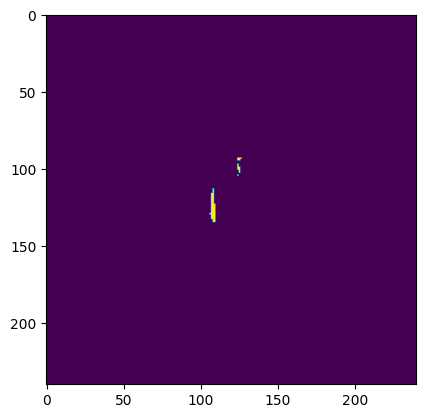

torch.Size([240, 240])


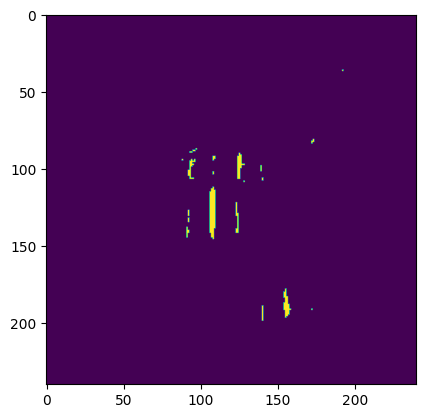

torch.Size([240, 240])


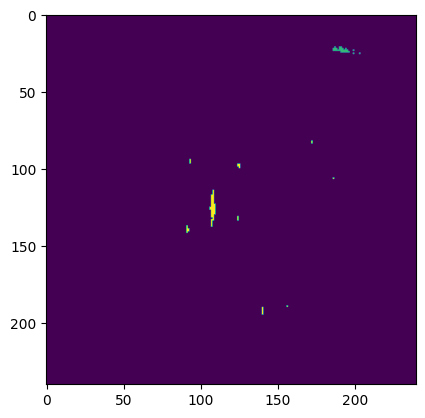

torch.Size([240, 240])


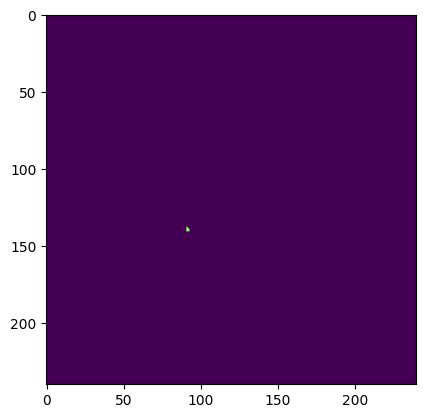

torch.Size([240, 240])


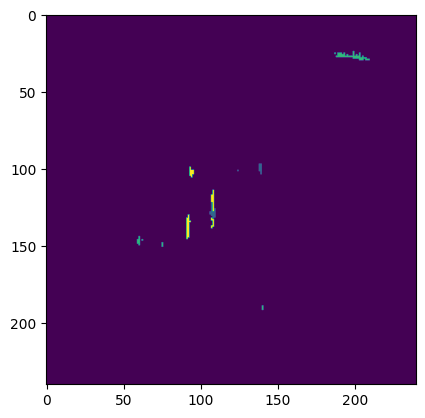

torch.Size([240, 240])


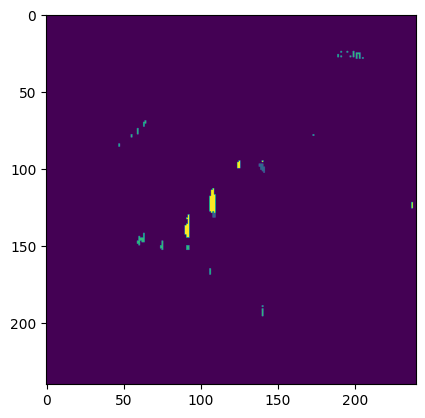

torch.Size([240, 240])


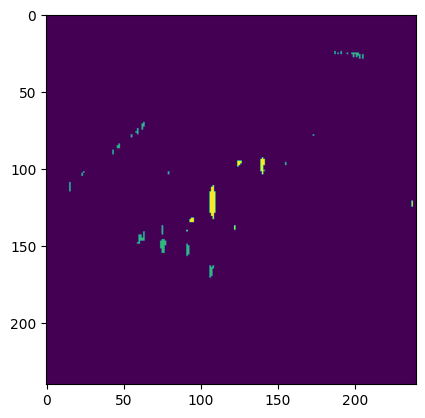

torch.Size([240, 240])


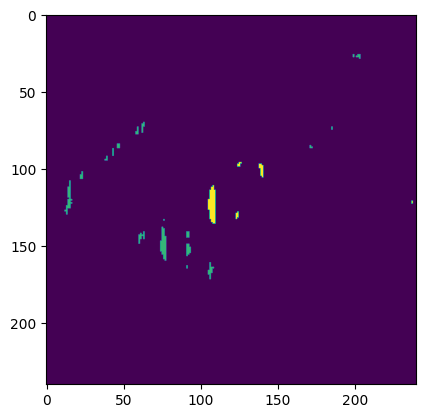

torch.Size([240, 240])


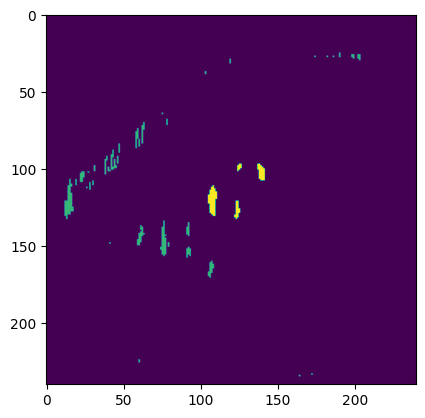

torch.Size([240, 240])


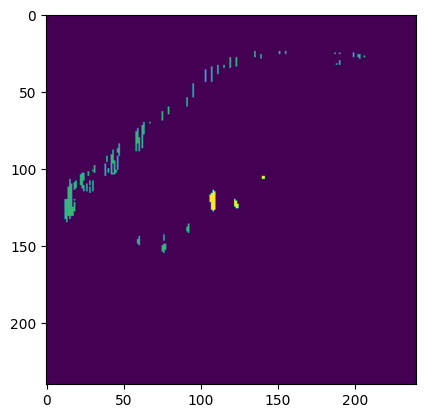

torch.Size([240, 240])


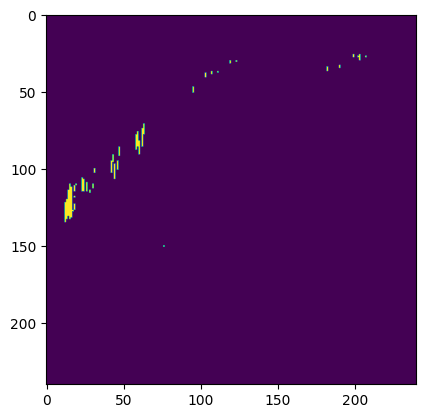

torch.Size([240, 240])


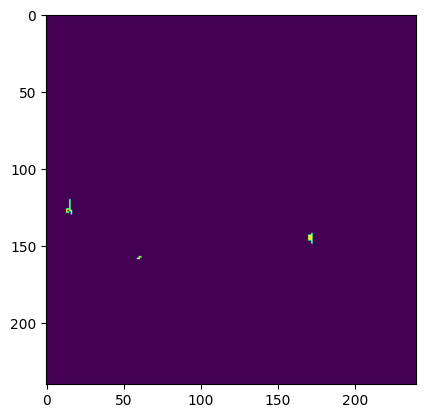

torch.Size([240, 240])


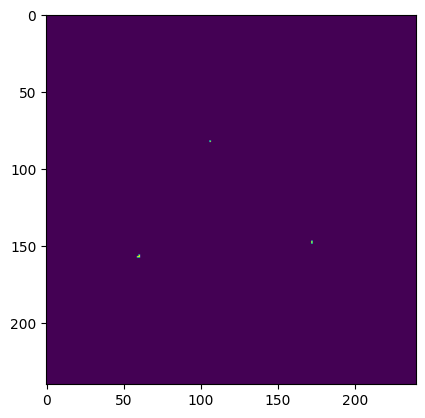

torch.Size([240, 240])


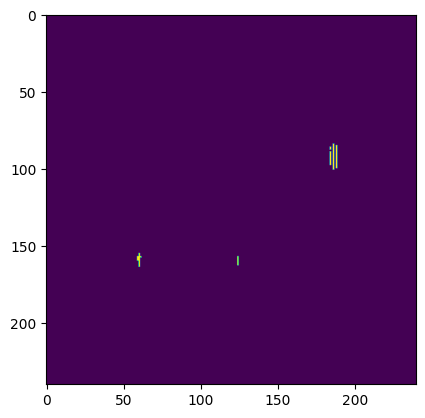

torch.Size([240, 240])


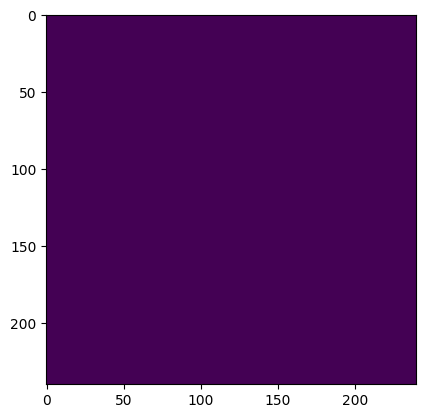

torch.Size([240, 240])


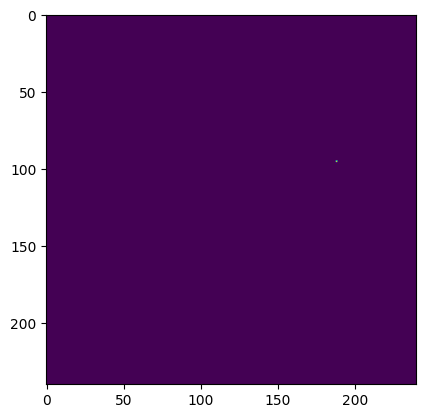

torch.Size([240, 240])


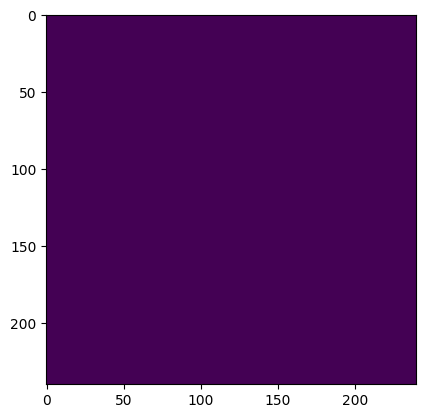

torch.Size([240, 240])


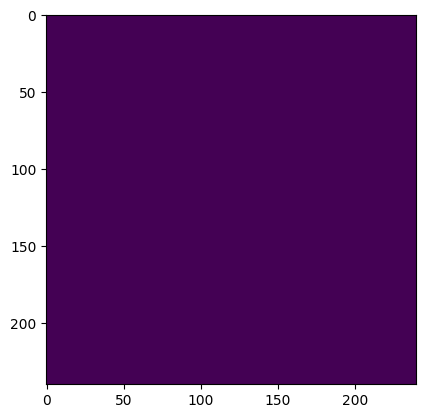

torch.Size([240, 240])


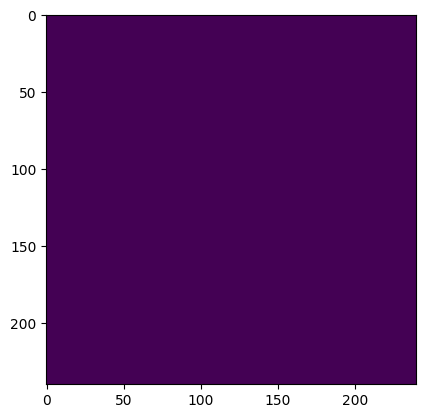

torch.Size([240, 240])


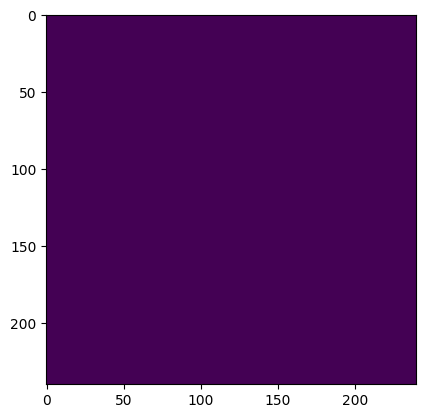

torch.Size([240, 240])


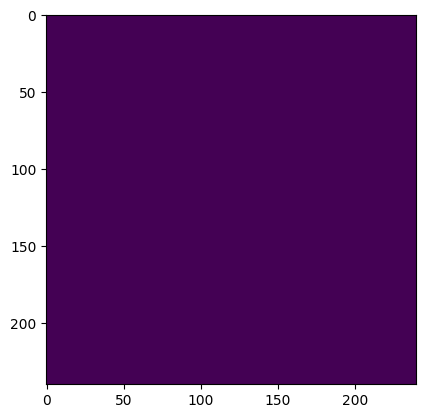

torch.Size([240, 240])


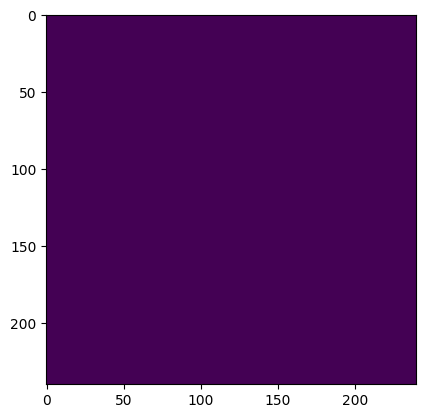

torch.Size([240, 240])


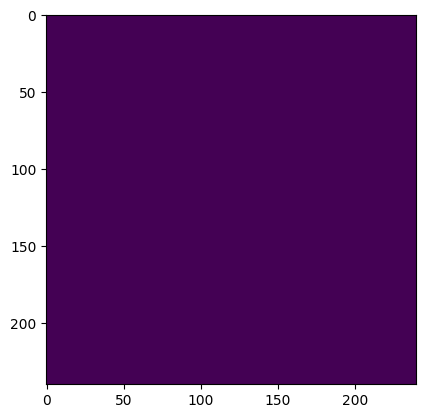

torch.Size([240, 240])


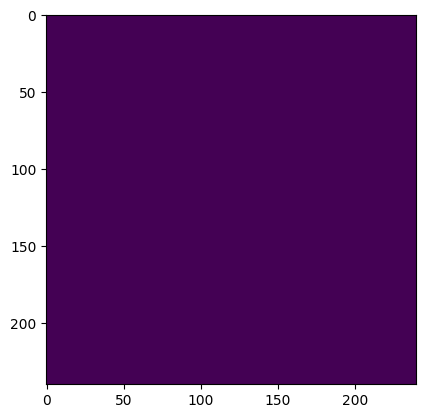

torch.Size([240, 240])


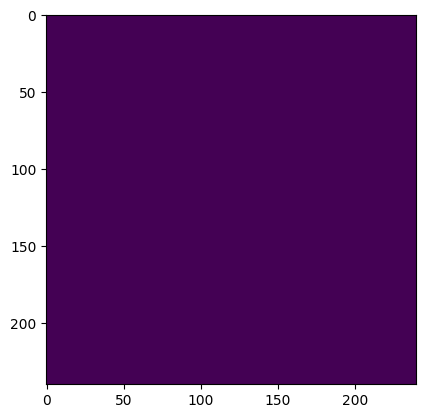

torch.Size([240, 240])


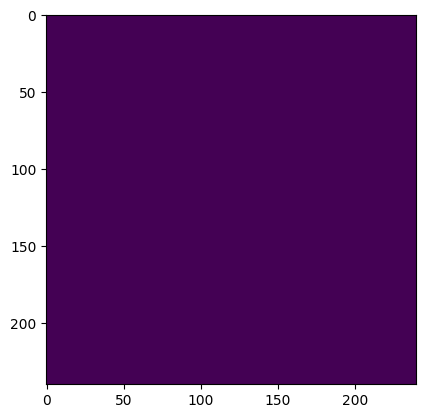

torch.Size([240, 240])


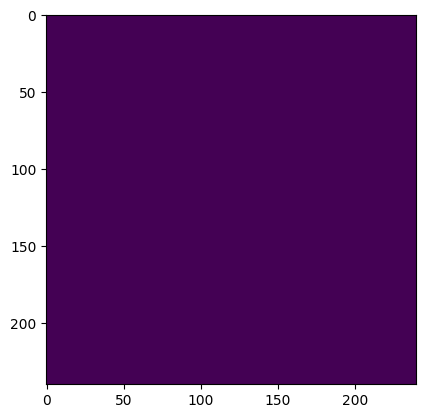

torch.Size([240, 240])


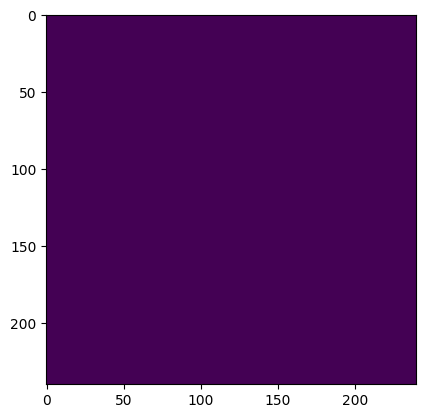

torch.Size([240, 240])


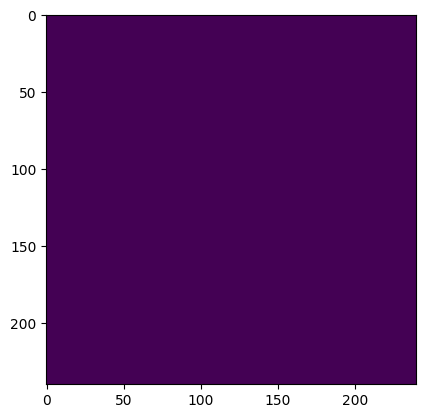

torch.Size([240, 240])


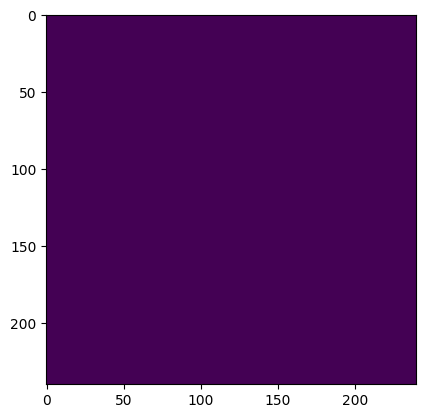

torch.Size([240, 240])


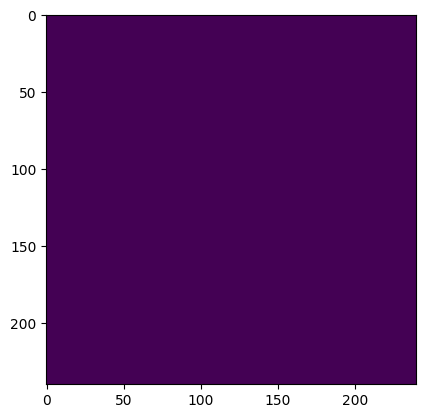

torch.Size([240, 240])


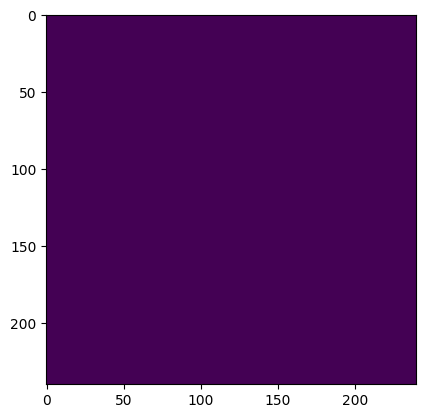

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def visualize_prediction(image, model, device='cuda'):
    # Assuming 'image' is a numpy array of shape (D, H, W) where D is depth
    model.eval()
    with torch.no_grad():
        # Add batch and channel dimensions: from (D, H, W) to (1, 1, D, H, W)
        input_tensor = torch.tensor(image).unsqueeze(0).unsqueeze(0).float().to(device)
        # Get the prediction
        outputs = model(input_tensor)
        print(outputs.shape)

        for output in outputs:
          # output = output.permute(3,0,1,2,)
          print(output.shape)
          output = np.argmax(output.cpu().detach(), axis=0).squeeze(0)
          print(output.shape)
          output = output.permute(2,1,0)

          for img2d in output:
            print(img2d.shape)
            plt.imshow(img2d)
            plt.show()


# Example usage
device = 'cuda' if torch.cuda.is_available() else 'cpu'
visualize_prediction(images_validation[56], model.to(device), device)


In [ ]:
inputs.shape

torch.Size([2, 32, 240, 240])

torch.Size([2, 4, 32, 240, 240])
torch.Size([2, 32, 4, 240, 240])


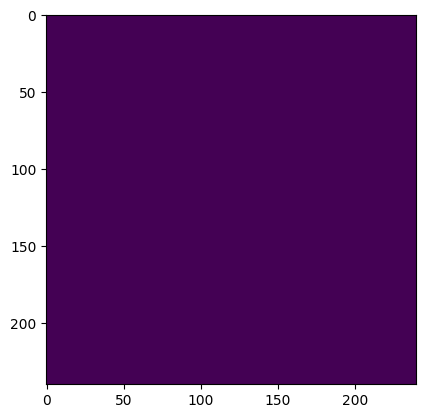

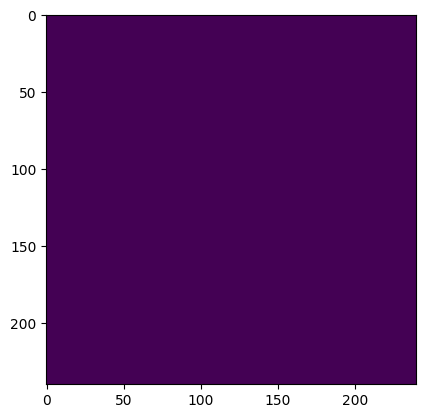

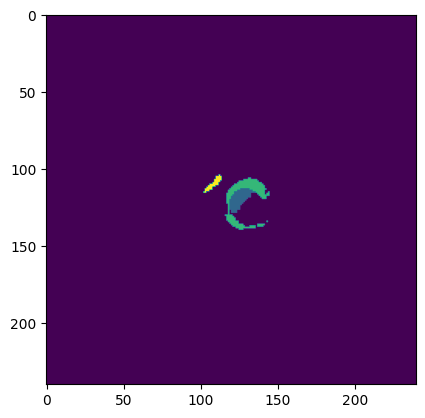

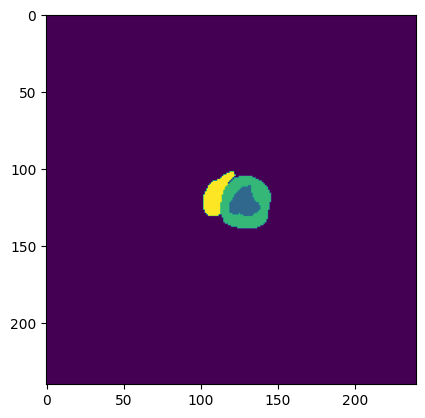

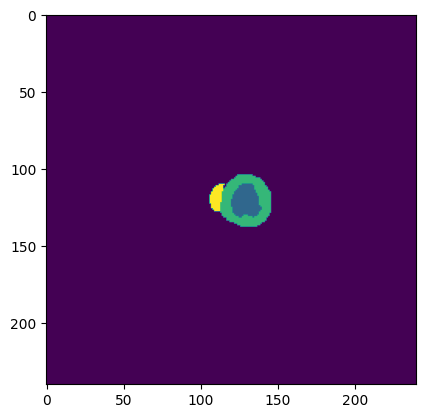

...

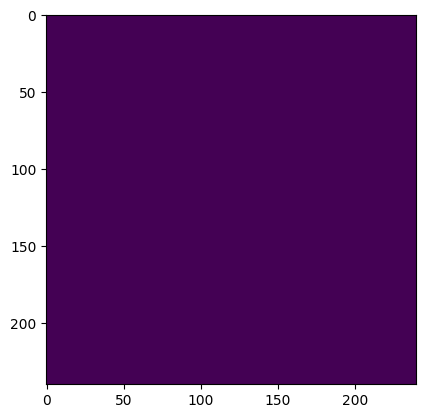

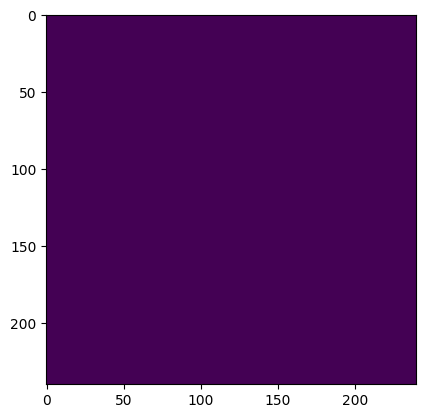

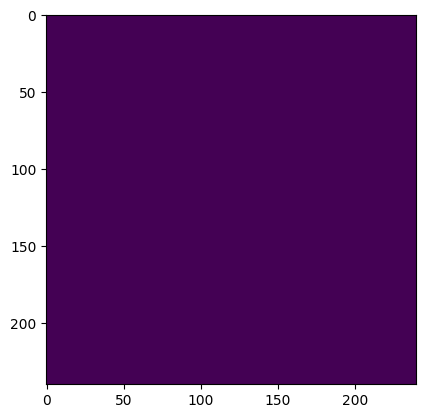

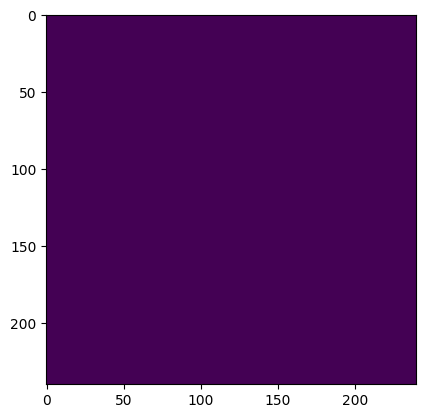

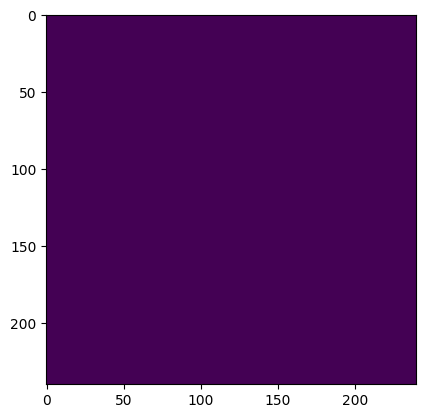

In [ ]:
inputs, classes = next(iter(val_loader))
predict_img(model,inputs.float(), classes, device)

============================= 3D image no: 1


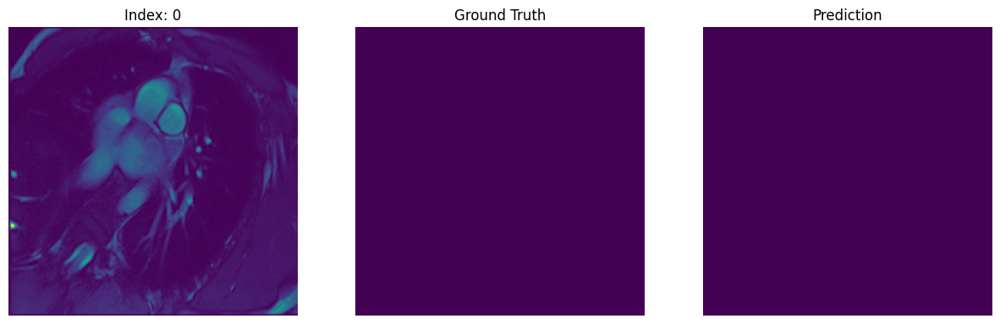

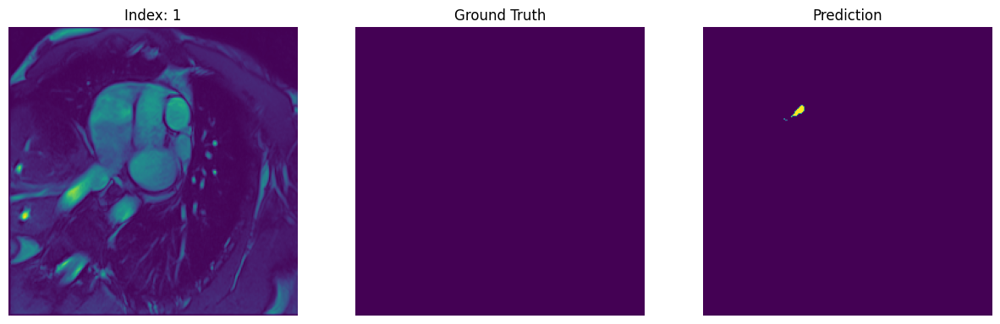

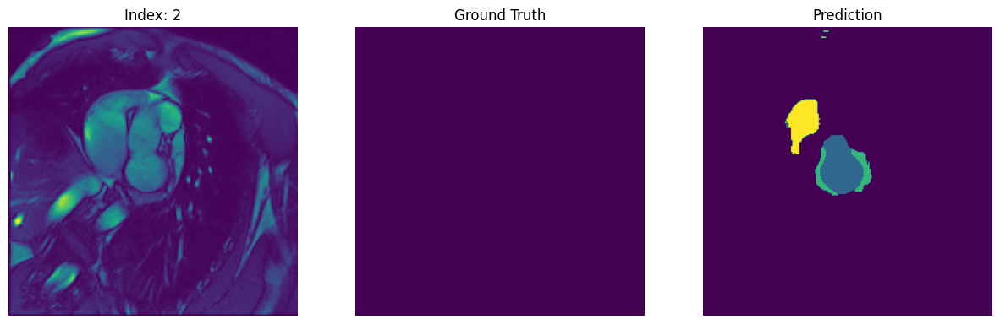

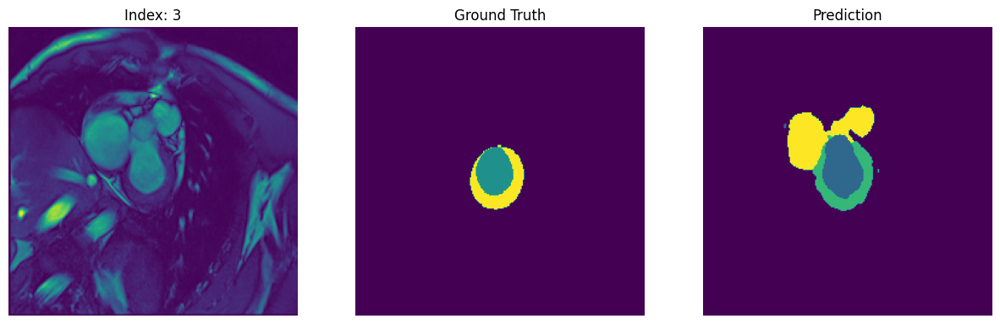

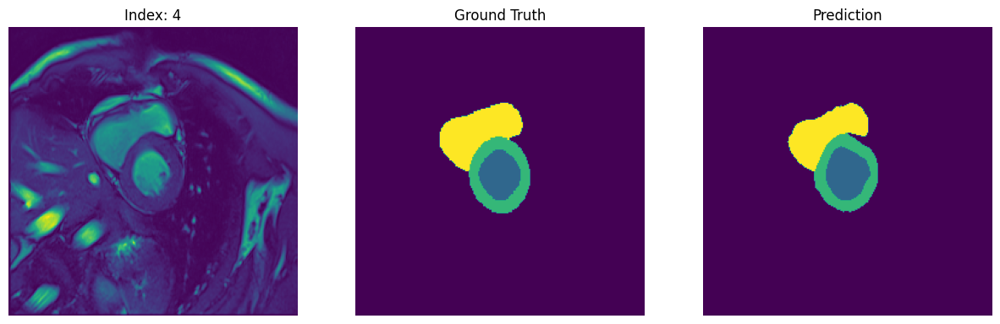

...

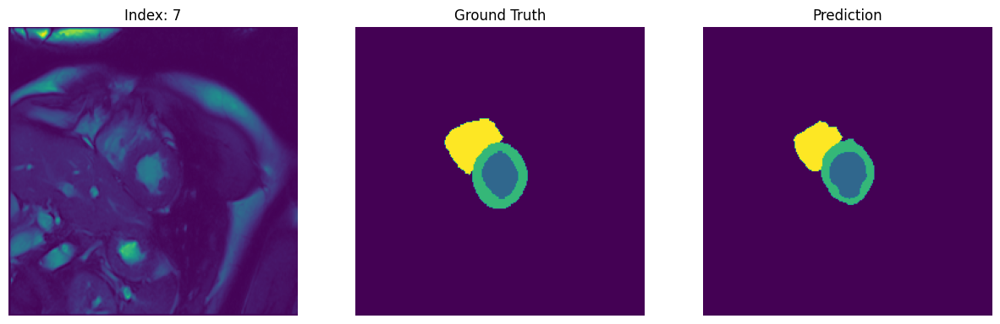

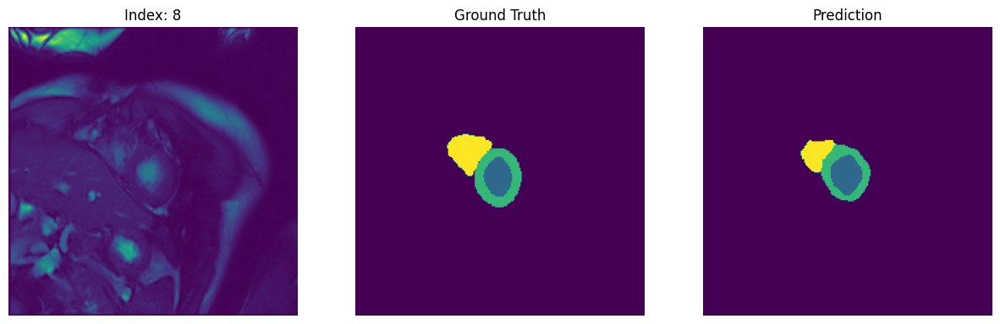

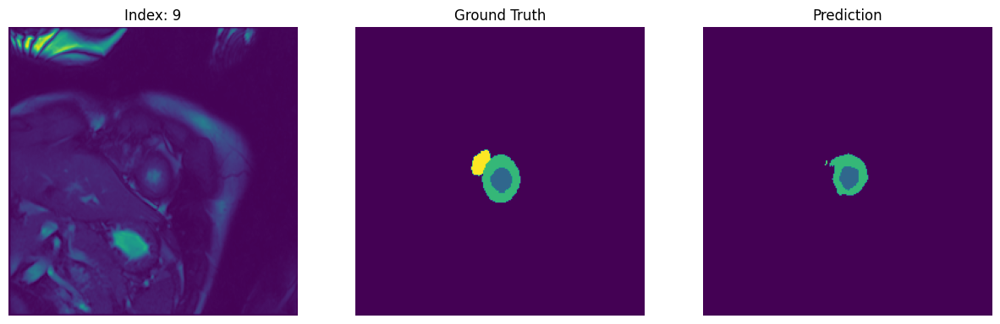

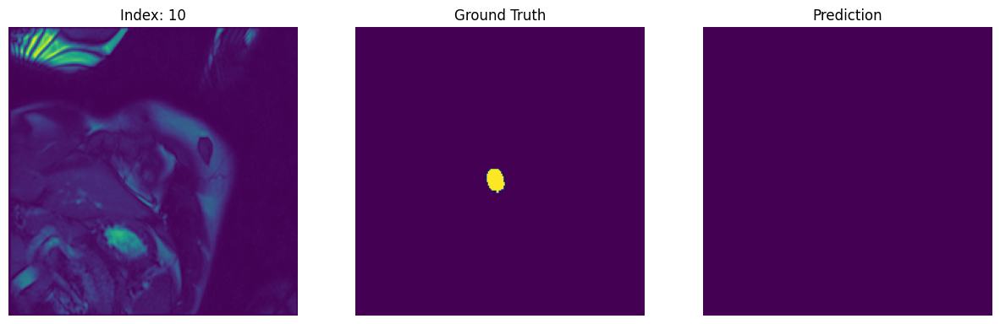

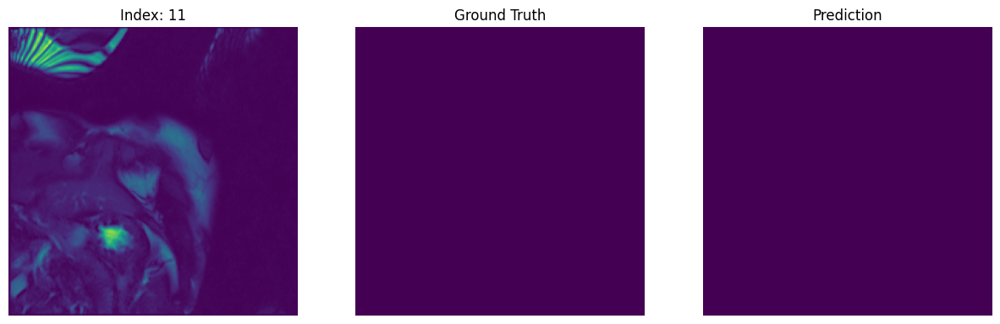

============================= 3D image no: 2


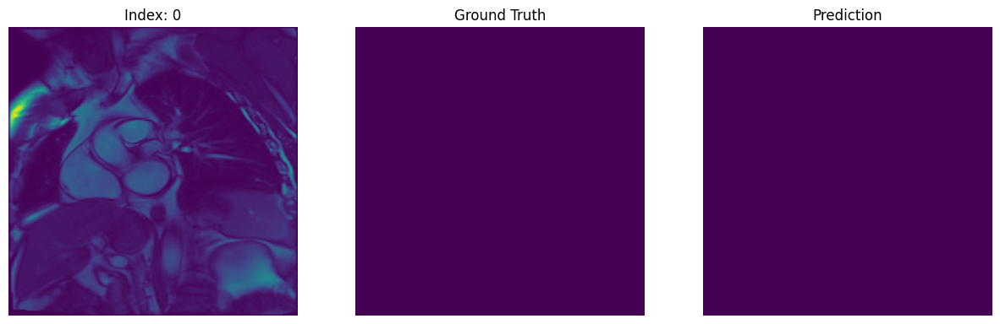

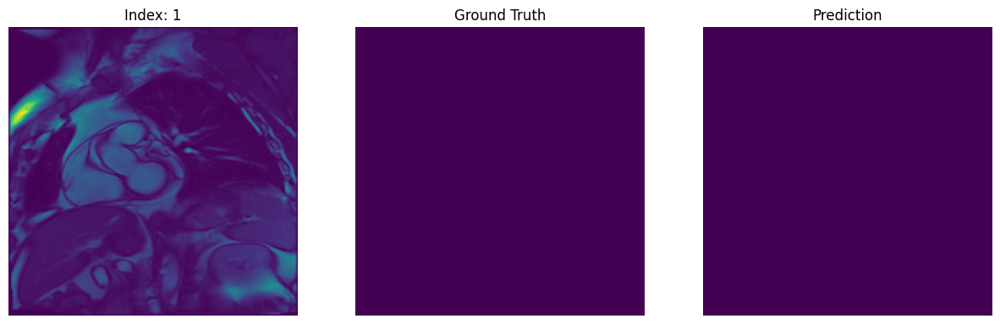

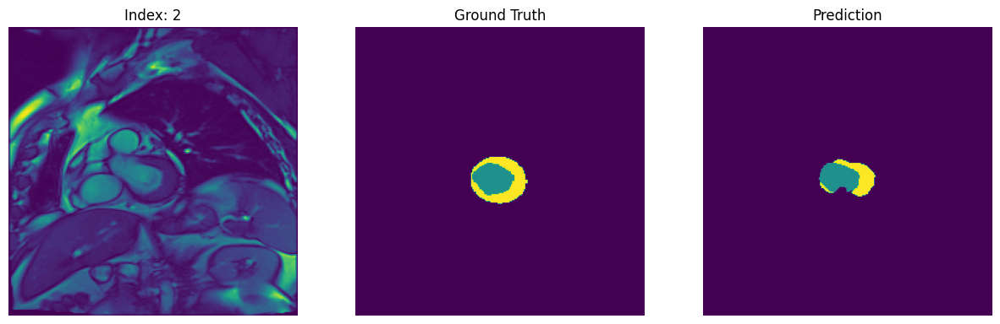

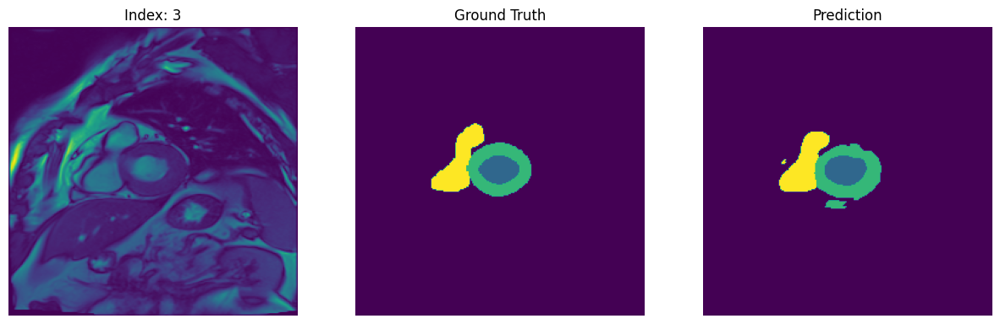

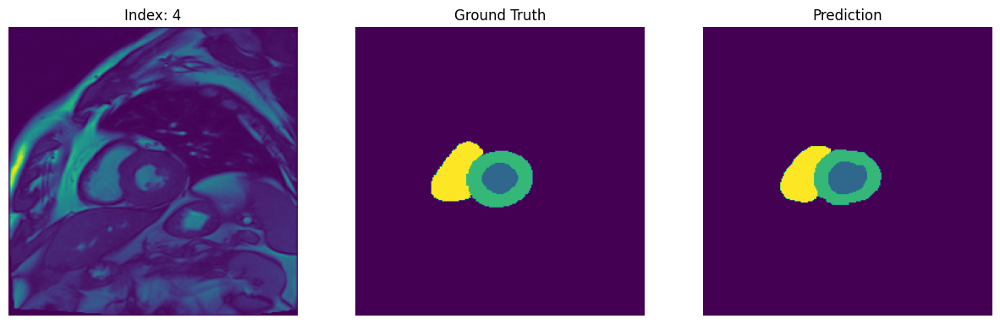

...

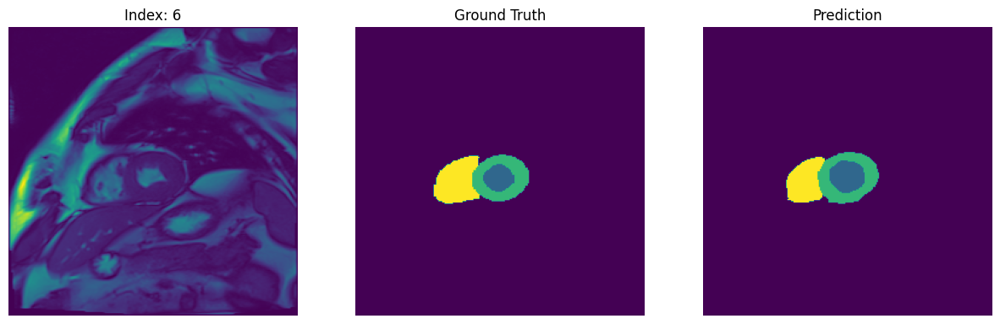

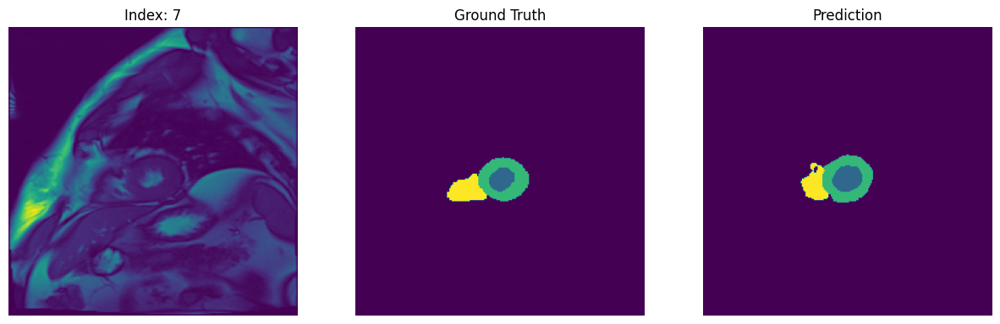

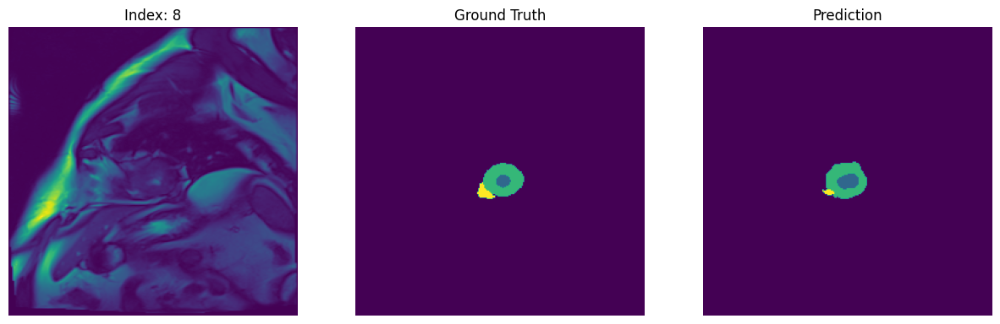

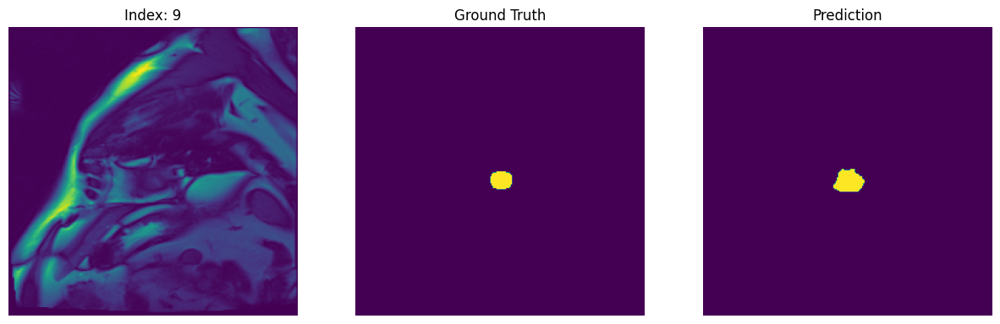

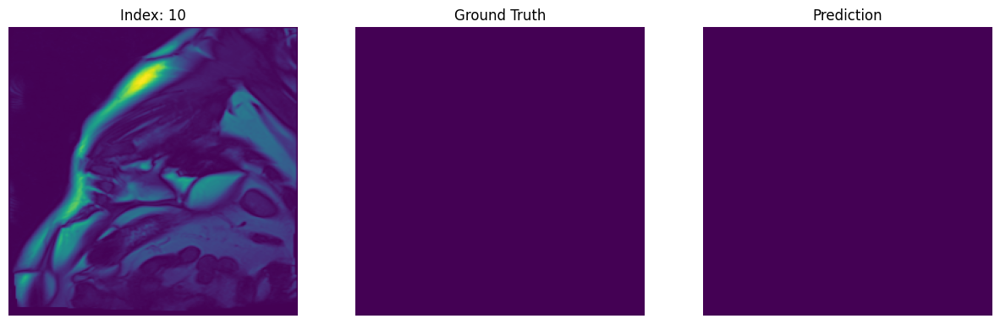

In [ ]:
inputs, classes = next(iter(test_loader))
predict_img(model,inputs.float(), classes, device)